# Dataset link
https://www.kaggle.com/datasets/smit1212/diabetic-data-cleaning


* encounter_id: رقم فريد لكل زيارة مريض.
* patient_nbr: رقم فريد لكل مريض (قد يكون للمريض زيارات متعددة).
* race: العرق (مثل Caucasian، African-American، وغيرها).
* gender: الجنس (ذكر/أنثى).
* age: الفئة العمرية (مثل [0-10)، [10-20) وهكذا).
* weight: وزن المريض.
* admission_type_id: نوع الدخول (حالة طارئة، مخطط لها...).
* discharge_disposition_id: طريقة الخروج من المستشفى (مثل الخروج إلى المنزل، التحويل إلى مستشفى آخر...).
* admission_source_id: مصدر الدخول (إحالة من طبيب، دخول ذاتي...).
* time_in_hospital: مدة الإقامة في المستشفى (عدد الأيام).
* payer_code: كود شركة التأمين.
* medical_specialty: التخصص الطبي (مثل الطب الباطني، طب الأسرة...).
* num_lab_procedures: عدد الفحوصات المخبرية.
* num_procedures: عدد الإجراءات الطبية (مثل العمليات الجراحية).
* num_medications: عدد الأدوية الموصوفة.
* number_outpatient: عدد الزيارات الخارجية.
* number_emergency: عدد زيارات الطوارئ.
* number_inpatient: عدد الزيارات الداخلية (الإقامة بالمستشفى).
* diag_1، diag_2، diag_3: الأكواد الخاصة بالتشخيص (ICD-9).
* number_diagnoses: عدد التشخيصات خلال الزيارة.
* max_glu_serum: قياس أعلى مستوى جلوكوز في مصل الدم.
* A1Cresult: نتيجة تحليل HbA1c (يشير إلى مستوى السكر التراكمي في الدم).
* medications: قائمة الأدوية المختلفة (metformin، insulin وغيرها).
* change: هل تم تغيير الأدوية؟ (Yes/No).
* diabetesMed: هل المريض يتناول أدوية السكري؟ (Yes/No).
* readmitted: حالة إعادة الدخول (مثلاً <30 يوم، >30 يوم، أو لا).

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

# Imoprt Libraries

In [3]:
# Import necessary libraries

import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation
import matplotlib.pyplot as plt  # For static visualizations
import random            # for Colors
import seaborn as sns  # For advanced statistical visualizations
import plotly.express as px  # For interactive plots (high-level)
import plotly.graph_objects as go  # For customizable interactive plots
from sklearn.preprocessing import StandardScaler  # For feature standardization
from sklearn.preprocessing import LabelEncoder  # For encoding categorical labels
from sklearn.preprocessing import MinMaxScaler  # For feature scaling to range [0, 1]
from sklearn.model_selection import train_test_split  # For splitting data into train/test sets


# Load the dataset

In [4]:
data =pd.read_csv(r"C:\Users\LAPTOP\Desktop\DS_Project(Depi)\archive(1)\diabetic_data.csv")

**1. Inspect the Data:**



* Understand the structure of the dataset: rows, columns, data types, and column names

*   Check for missing, duplicate, or inconsistent data.






In [5]:
#First 5 rows from the data
data.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [6]:
#Shape of the data
data.shape

(101766, 50)

In [7]:
#data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [8]:
#statistical summary
data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [9]:
#data types for each feature
data.dtypes

encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride         

In [10]:
#null Values
data.isnull().sum()

encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazo

In [11]:
#percantage of the missing values
data.isnull().mean()

encounter_id                0.0
patient_nbr                 0.0
race                        0.0
gender                      0.0
age                         0.0
weight                      0.0
admission_type_id           0.0
discharge_disposition_id    0.0
admission_source_id         0.0
time_in_hospital            0.0
payer_code                  0.0
medical_specialty           0.0
num_lab_procedures          0.0
num_procedures              0.0
num_medications             0.0
number_outpatient           0.0
number_emergency            0.0
number_inpatient            0.0
diag_1                      0.0
diag_2                      0.0
diag_3                      0.0
number_diagnoses            0.0
max_glu_serum               0.0
A1Cresult                   0.0
metformin                   0.0
repaglinide                 0.0
nateglinide                 0.0
chlorpropamide              0.0
glimepiride                 0.0
acetohexamide               0.0
glipizide                   0.0
glyburid

In [12]:
data.duplicated().sum()

0

# EDA (Exploratory data analysis) Before Cleaning:
     - understand the structure of the dataset.
     - Identify key features, the distribution of health-related data points, and any potential
     patterns.
     - Identify missing values, inconsistencies, and outliers


In [13]:
# Categorical Columns
categorical=list(data.select_dtypes(include='object').columns)
categorical

['race',
 'gender',
 'age',
 'weight',
 'payer_code',
 'medical_specialty',
 'diag_1',
 'diag_2',
 'diag_3',
 'max_glu_serum',
 'A1Cresult',
 'metformin',
 'repaglinide',
 'nateglinide',
 'chlorpropamide',
 'glimepiride',
 'acetohexamide',
 'glipizide',
 'glyburide',
 'tolbutamide',
 'pioglitazone',
 'rosiglitazone',
 'acarbose',
 'miglitol',
 'troglitazone',
 'tolazamide',
 'examide',
 'citoglipton',
 'insulin',
 'glyburide-metformin',
 'glipizide-metformin',
 'glimepiride-pioglitazone',
 'metformin-rosiglitazone',
 'metformin-pioglitazone',
 'change',
 'diabetesMed',
 'readmitted']

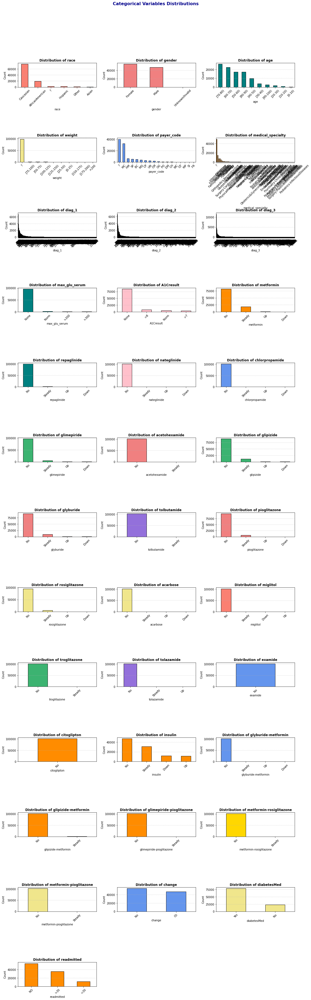

In [14]:
import random
# List of colors for the plots
colors = [
    'cornflowerblue', 'salmon', 'gold', 'mediumseagreen', 'mediumpurple',
    'darkorange', 'pink', 'lightcoral', 'teal', 'khaki'
]
# Number of subplots per row
n_cols = 3
n_rows = (len(categorical) + n_cols - 1) // n_cols  # Calculate rows based on number of categories

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 4))  # Adjust figure size dynamically
axes = axes.flatten()

# Plot each categorical column in a subplot
for i, col in enumerate(categorical):
    value_counts = data[col].value_counts()

    # Bar plot with enhancements and unique colors
    value_counts.plot(
        kind='bar',
        ax=axes[i],
        color=random.choice(colors),  # Pick a random color for each plot
        edgecolor='black',
    )

    # Add titles and labels
    axes[i].set_title(f"Distribution of {col}", fontsize=12, fontweight='bold')
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel('Count', fontsize=10)
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for clarity
    axes[i].grid(axis='y', linestyle='--', alpha=0.6)  # Add gridlines for better readability

# Hide extra subplots
for j in range(len(categorical), len(axes)):
    axes[j].axis('off')  # Turn off unused subplots

# Add overall title
fig.suptitle("Categorical Variables Distributions", fontsize=16, fontweight='bold', color='darkblue')
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust spacing to fit the main title
plt.show()


In [15]:
# Numerical Columns
Numerical=list(data.select_dtypes(include='int').columns)
Numerical

['encounter_id',
 'patient_nbr',
 'admission_type_id',
 'discharge_disposition_id',
 'admission_source_id',
 'time_in_hospital',
 'num_lab_procedures',
 'num_procedures',
 'num_medications',
 'number_outpatient',
 'number_emergency',
 'number_inpatient',
 'number_diagnoses']

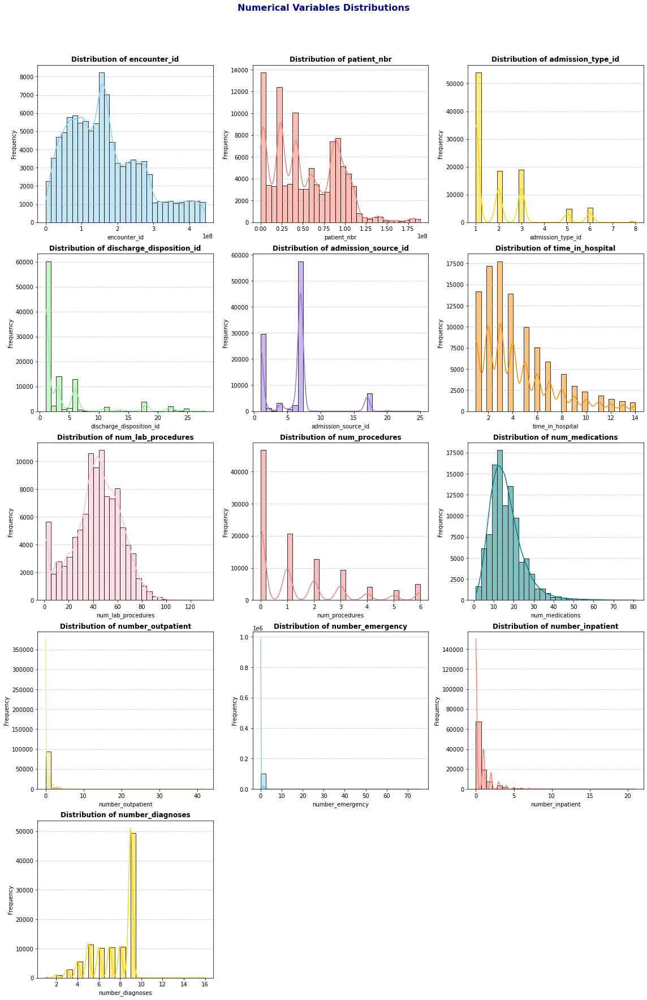

In [16]:


# List of colors for the histograms
colors = [
    'skyblue', 'salmon', 'gold', 'lightgreen', 'mediumpurple',
    'darkorange', 'pink', 'lightcoral', 'teal', 'khaki'
]

# Number of subplots per row
n_cols = 3
n_rows = (len(Numerical) + n_cols - 1) // n_cols  # Calculate rows based on the number of columns

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 5))  # Adjust figure size dynamically
axes = axes.flatten()

# Plot each numerical column in a subplot
for i, col in enumerate(Numerical):
    # Select a unique color for each graph
    color = colors[i % len(colors)]

    # Histogram with KDE (density curve)
    sns.histplot(data[col], kde=True, ax=axes[i], color=color, edgecolor="black", bins=30)

    # Add titles and labels
    axes[i].set_title(f"Distribution of {col}", fontsize=12, fontweight="bold")
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel("Frequency", fontsize=10)
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)  # Add gridlines for better readability

# Hide extra subplots
for j in range(len(Numerical), len(axes)):
    axes[j].axis("off")  # Turn off unused subplots

# Add overall title
fig.suptitle("Numerical Variables Distributions", fontsize=16, fontweight="bold", color="darkblue")
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust spacing to fit the main title
plt.show()


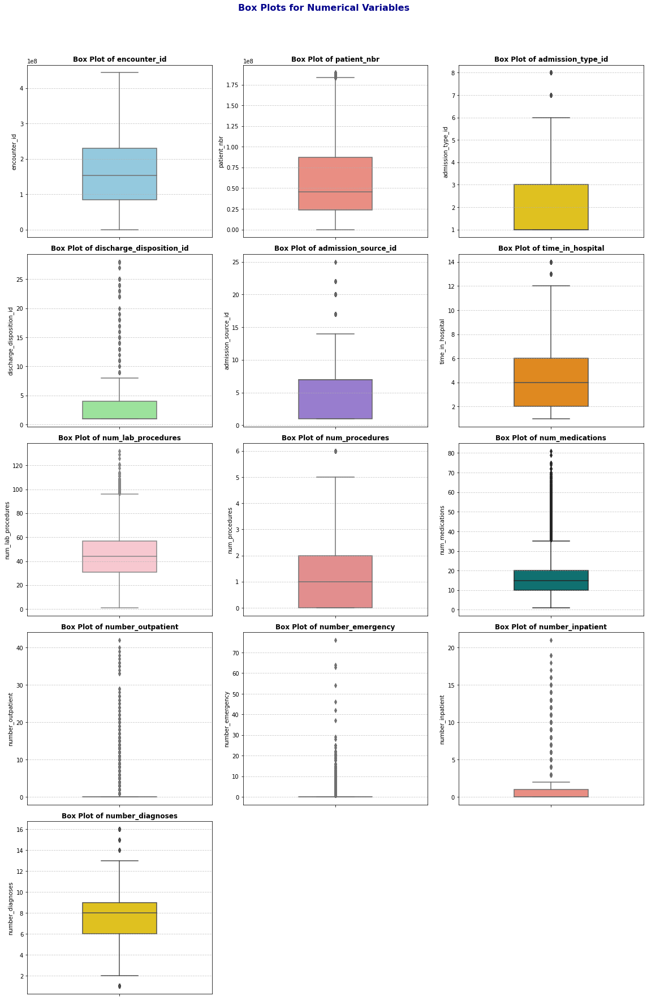

In [17]:

# List of colors for the box plots
colors = [
    'skyblue', 'salmon', 'gold', 'lightgreen', 'mediumpurple',
    'darkorange', 'pink', 'lightcoral', 'teal', 'khaki'
]

# Number of subplots per row
n_cols = 3
n_rows = (len(Numerical) + n_cols - 1) // n_cols  # Calculate rows dynamically

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 5))
axes = axes.flatten()

# Plot each numerical column in a subplot
for i, col in enumerate(Numerical):
    # Use a unique color for each box plot
    sns.boxplot(
        y=data[col],
        ax=axes[i],
        color=colors[i % len(colors)],  # Cycle through the color list
        width=0.4
    )
    # Add titles and labels
    axes[i].set_title(f"Box Plot of {col}", fontsize=12, fontweight="bold")
    axes[i].set_ylabel(col, fontsize=10)
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)  # Add gridlines for better readability

# Hide extra subplots
for j in range(len(Numerical), len(axes)):
    axes[j].axis("off")

# Add an overall title
fig.suptitle("Box Plots for Numerical Variables", fontsize=16, fontweight="bold", color="darkblue")
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


# Interactive Visulaztion

In [18]:


# Define custom colors for gender
custom_colors = {
    "Male": "blue",     # Vibrant blue for Male
    "Female": "purple"  # Vibrant purple for Female
}

# Create the bar chart
fig = px.bar(
    data,
    x="race",
    y="weight",
    color="gender",
    barmode="group",
    title="Distribution of Patients by Race and Gender",
    labels={"weight": "Weights of Patients", "race": "Race", "gender": "Gender"},
    color_discrete_map=custom_colors
)

# Customize the layout of the chart
fig.update_layout(
    plot_bgcolor="rgba(240, 240, 240, 0.9)",  # Light gray background for the plot area
    paper_bgcolor="rgba(230, 230, 230, 0.9)",  # Slightly darker gray for the entire chart area
    font=dict(color="black"),  # Set font color to black for better contrast
    title_font=dict(size=20, color="darkblue", family="Arial"),  # Customize title font
    legend_title=dict(font=dict(size=14, color="darkblue")),  # Legend title styling
    xaxis=dict(title_font=dict(size=12, color="black")),  # Customize x-axis label font
    yaxis=dict(title_font=dict(size=12, color="black")),  # Customize y-axis label font
    bargap=0.15,  # Adjust bar spacing for better readability
    bargroupgap=0.1  # Adjust group spacing between bar groups
)

# Display the chart
fig.show()


In [19]:
#Age distribution of patients
#Histogram: to see the frequency distribution of ages.
fig = px.histogram(data, x="age", nbins=20,  # Adjust the number of bins
                   title="Age Distribution of Patients",
                   labels={"age": "age"},
                   color_discrete_sequence=["#1f77b4"])  # Custom color

# Customize the background and layout
fig.update_layout(
    plot_bgcolor="rgba(240, 240, 240, 0.9)",  # Light gray background for the plot area
    paper_bgcolor="rgba(200, 200, 200, 0.9)",  # Slightly darker gray for the entire chart area
    font=dict(color="black"),  # Set font color to black for better contrast
    title_font=dict(size=20, color="purple")  # Customize title font
)

# Show the chart
fig.show()

In [20]:
#Box plot:to focus on the spread, central tendency, and outliers in the age data.
fig = px.box(data, y="age", color="gender",
             title="Age Distribution of Patients",
             labels={"age": "Age"},
             color_discrete_sequence=["#6a5acd"])  # Custom color

# Customize the background and layout
fig.update_layout(
    plot_bgcolor="rgba(240, 240, 240, 0.9)",  # Light gray background for the plot area
    paper_bgcolor="rgba(200, 200, 200, 0.9)",  # Slightly darker gray for the entire chart area
    font=dict(color="black"),  # Set font color to black for better contrast
    title_font=dict(size=20, color="darkblue")  # Customize title font
)

# Show the chart
fig.show()

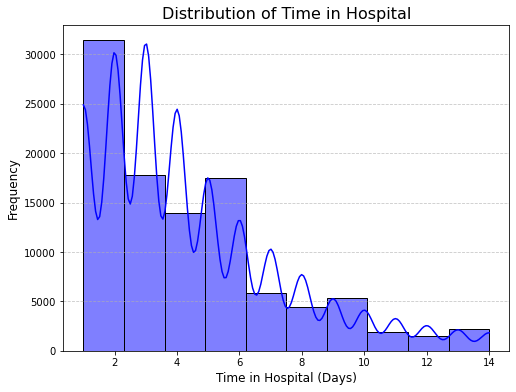

In [21]:
#Understand the length of hospital stays
plt.figure(figsize=(8, 6))
sns.histplot(data['time_in_hospital'], bins=10, kde=True, color='blue')

# Add titles and labels
plt.title("Distribution of Time in Hospital", fontsize=16)
plt.xlabel("Time in Hospital (Days)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

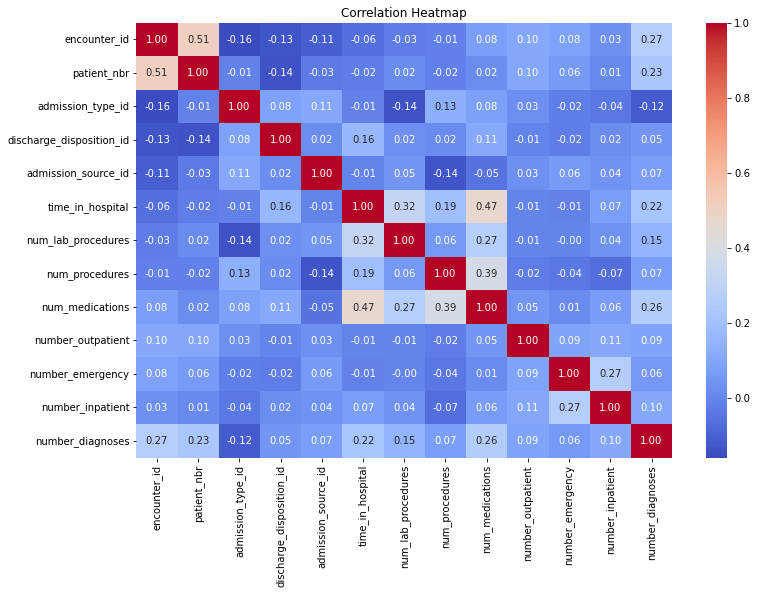

In [22]:
#heatmap for numerical features
numeric_data = data.select_dtypes(include=['number'])
corr = numeric_data.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

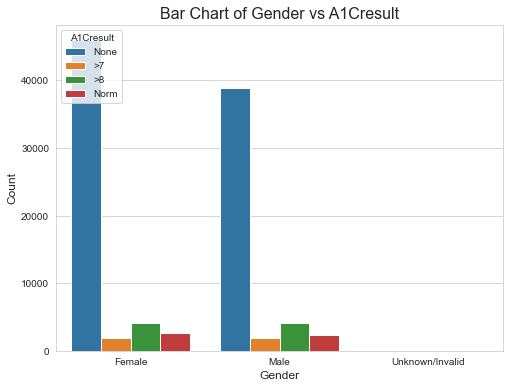

In [23]:
# Set plot style
sns.set_style("whitegrid")
# Create a count plot
plt.figure(figsize=(8, 6))
sns.countplot(x='gender', hue='A1Cresult', data=data)

# Add titles and labels
plt.title('Bar Chart of Gender vs A1Cresult', fontsize=16)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show the plot
plt.show()

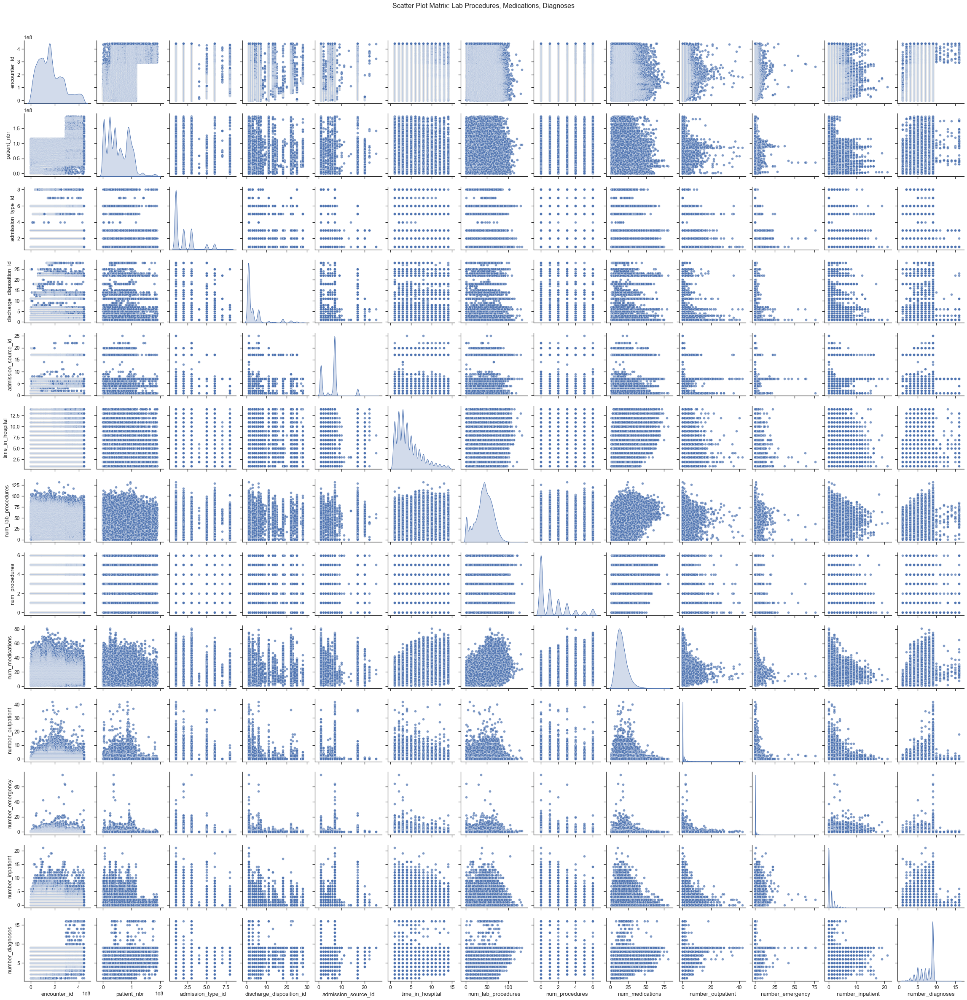

In [24]:
df = pd.DataFrame(data)

# Create the scatter plot matrix
sns.set(style="ticks", font_scale=1.1)
pair_plot = sns.pairplot(df, diag_kind="kde", plot_kws={'alpha': 0.7})

# Add a title
pair_plot.fig.suptitle("Scatter Plot Matrix: Lab Procedures, Medications, Diagnoses",
                       y=1.02, fontsize=16)

# Show the plot
plt.show()

In [26]:
#Explore patterns in medication prescription and adjustments.
# Set plot style
sns.set_style("whitegrid")
plt.figure(figsize=(8, 6))
sns.countplot(data, x='metformin', hue='insulin', palette='Set1')

# Add titles and labels
plt.title('Grouped Bar Chart of Metformin vs Insulin Usage', fontsize=16)
plt.xlabel('Metformin Usage', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show the plot
plt.show()

ValueError: Could not interpret input 'insulin'

<Figure size 576x432 with 0 Axes>

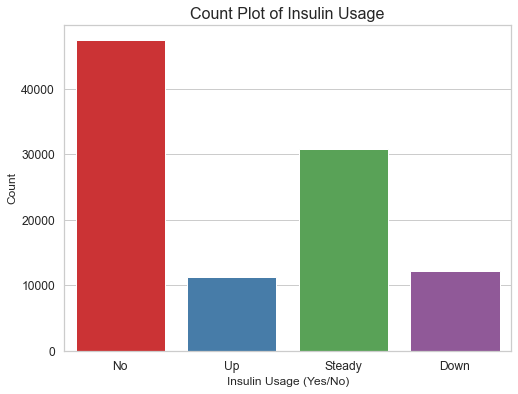

In [27]:
# Create the count plot for insulin usage (True/False or 1/0)
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='insulin', palette='Set1')

# Add titles and labels
plt.title("Count Plot of Insulin Usage", fontsize=16)
plt.xlabel("Insulin Usage (Yes/No)", fontsize=12)
plt.ylabel("Count", fontsize=12)

# Display the plot
plt.show()

In [28]:
#Show medication changes and their correlation with readmissions.
plt.figure(figsize=(8, 6))
sns.scatterplot(data, x='readmitted', y='num_lab_procedures',
                size='time_in_hospital', sizes=(20, 200), hue='readmitted', palette='Set2', legend=None)

# Add titles and labels
plt.title('Bubble Chart: Readmission Status vs Lab Procedures with Time in Hospital', fontsize=16)
plt.xlabel('Readmitted', fontsize=12)
plt.ylabel('Number of Lab Procedures', fontsize=12)

# Show the plot
plt.show()

C:\Users\LAPTOP\anaconda33\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



ValueError: Could not interpret value `num_lab_procedures` for parameter `y`

<Figure size 576x432 with 0 Axes>

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data, x='readmitted', palette='viridis')

# Add titles and labels
plt.title('Bar Chart of Readmission Status Distribution', fontsize=16)
plt.xlabel('Readmitted', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Show the plot
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data, x='diabetesMed', hue='change', dodge=False, palette='Set2')

# Add titles and labels
plt.title('Stacked Bar Chart: Medication Change and DiabetesMed with Readmission Status', fontsize=16)
plt.xlabel('Diabetes Medication', fontsize=12)
plt.ylabel('Count of Patients', fontsize=12)

# Show the plot
plt.show()

In [ ]:
# Distribution of Time in Hospital
fig_time = px.histogram(data, x='time_in_hospital', title='Distribution of Time in Hospital')
fig_time.show()

# Number of Diagnoses
fig_diagnoses = px.histogram(data, x='number_diagnoses', title='Distribution of Number of Diagnoses')
fig_diagnoses.show()

# Readmission Rate
fig_readmission = px.pie(data, names='readmitted', title='Readmission Rate')
fig_readmission.show()

In [ ]:
fig_readmission = px.pie(data, names='age', title='AGE')
fig_readmission.show()

# Data Cleaing :

    o Handle missing data using techniques such as imputation or removal.
    
    o Normalize or standardize data for model compatibility.
    
    o Encode categorical variables if necessary

**1. Handle Missing Data:**

In [ ]:
print("\nMissing Values:")
print(data.isnull().sum())
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [ ]:
# Replace missing values with 'No Test'
data['max_glu_serum'] = data['max_glu_serum'].fillna('No Test')
data['A1Cresult'] = data['A1Cresult'].fillna('No Test')
print(data.info())

In [ ]:
# Check for '?' values (before replacing them with NaN)
question_mark_counts = (data == '?').sum()

# Print the number of '?' in each column
print("Number of '?' values per column:")
print(question_mark_counts)

# Replace '?' with NaN in the entire dataset
data.replace('?', pd.NA, inplace=True)

# Now check for missing values (NaN) after replacing '?'
missing_values = data.isnull().sum()

# Print the number of missing values per column
print("\nNumber of missing values per column after replacing '?':")
print(missing_values)


In [ ]:
# Drop the 'weight' column
data = data.drop(columns=['weight'])
# Fill missing values for 'race', 'payer_code', 'medical_specialty', 'diag_1', 'diag_2', 'diag_3' with the mode (most frequent value)
data['race'] = data['race'].fillna(data['race'].mode()[0])
data['payer_code'] = data['payer_code'].fillna(data['payer_code'].mode()[0])
data['medical_specialty'] = data['medical_specialty'].fillna(data['medical_specialty'].mode()[0])
data['diag_1'] = data['diag_1'].fillna(data['diag_1'].mode()[0])
data['diag_2'] = data['diag_2'].fillna(data['diag_2'].mode()[0])
data['diag_3'] = data['diag_3'].fillna(data['diag_3'].mode()[0])

# Check if all missing values have been handled
print(data.isnull().sum())
print(data.shape)


In [ ]:
data

In [ ]:
print(data.info())

**2.   Remove Duplicate Entries:**

In [ ]:
# Drop duplicate rows
data = data.drop_duplicates()

**3. Data Type Conversion**

In [ ]:
# Convert 'age' column (if needed, extract numeric values first)
# If 'age' column contains ranges like '[0-10)', we'll extract the lower bound
if data['age'].dtype == 'object':  # Check if age is still in string format
    data['age'] = data['age'].str.extract(r'(\d+)').astype(float)  # Extract the number before the hyphen

# Check if there are any non-numeric values left in 'age'
print(data['age'].unique())  # Ensure it looks correct

# Convert 'num_lab_procedures' to integers (check for non-numeric entries first)
data['num_lab_procedures'] = pd.to_numeric(data['num_lab_procedures'], errors='coerce')  # Convert non-numeric to NaN
data['num_lab_procedures'] = data['num_lab_procedures'].fillna(data['num_lab_procedures'].median()).astype(int)  # Impute missing values with median and convert to int

# Convert 'gender' and 'race' columns to categorical type
data['gender'] = data['gender'].astype('category')
data['race'] = data['race'].astype('category')


# Check data types after transformation
print(data.info())

# Optional: Check summary statistics to confirm everything is correct
print(data.describe())


**4. Outlier Detection and Handling**

In [ ]:
# Visualize numerical columns with boxplots to spot outliers
sns.boxplot(x=data['num_lab_procedures'])
plt.show()


In [ ]:
# Apply log transformation to 'num_lab_procedures' to reduce skewness
data['num_lab_procedures'] = np.log1p(data['num_lab_procedures'])


In [ ]:
# Remove outliers from 'number_emergency' based on IQR method
Q1 = data['number_emergency'].quantile(0.25)
Q3 = data['number_emergency'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter rows within the acceptable range
data = data[(data['number_emergency'] >= lower_bound) & (data['number_emergency'] <= upper_bound)]


In [ ]:
# Cap outliers in 'time_in_hospital' using the 1st and 99th percentiles
lower_cap = data['time_in_hospital'].quantile(0.01)
upper_cap = data['time_in_hospital'].quantile(0.99)
data['time_in_hospital'] = data['time_in_hospital'].clip(lower=lower_cap, upper=upper_cap)


In [ ]:
data.to_csv('data_after_Cleaing.csv', index=False)


**Exploratory Data Analysis (EDA) after Cleaning**

In [ ]:
# Select numerical and categorical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns

# Univariate Analysis: Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30, color='coral')  # Use 'coral' color
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Univariate Analysis: Categorical Columns
for col in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=col, data=data, order=data[col].value_counts().index, palette="pastel")  # Use 'pastel' palette
    plt.title(f"Count Plot of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

# Bivariate Analysis: Correlation Heatmap (Numerical Columns)
plt.figure(figsize=(10, 6))
sns.heatmap(
    data[numerical_columns].corr(),
    annot=True,
    cmap='coolwarm',  # Use 'coolwarm' color map for heatmap
    fmt='.2f',
    linewidths=0.5
)
plt.title("Correlation Heatmap")
plt.show()

# Pair Plot for Multivariate Analysis (Numerical Columns)
sns.pairplot(df[numerical_columns], diag_kind='kde', corner=True, palette='husl')  # Use 'husl' palette
plt.suptitle("Pair Plot of Numerical Variables", y=1.02)
plt.show()


In [ ]:

fig = px.scatter(
    data,
    x='age',  # Replace with actual numerical column name from your dataset
    y='time_in_hospital',  # Replace with another numerical column name
    color='readmitted',  # Replace with categorical column (e.g., readmitted)
    title="Scatter Plot: Age vs Time in Hospital",
    labels={'age': 'Age', 'time_in_hospital': 'Time in Hospital'},
    opacity=0.7
)
fig.show()

# Example Histogram: Distribution of a numerical column with categorical grouping
fig = px.histogram(
    data,
    x='age',  # Replace with numerical column name
    color='readmitted',  # Categorical column (e.g., readmitted or gender)
    nbins=30,
    title="Histogram of Age by Readmission Status",
    labels={'age': 'Age', 'count': 'Count'}
)
fig.update_layout(bargap=0.2)  # Adjust bar spacing
fig.show()


**Data Preparation for Modeling**

**1. Feature Engineering**

In [ ]:
# Example of creating interaction features
data['time_diagnoses_interaction'] = data['time_in_hospital'] * data['number_diagnoses']


In [ ]:
# Binning Age into categories
bins = [0, 18, 30, 40, 50, 60, 100]
labels = ['<18', '18-30', '31-40', '41-50', '51-60', '60+']
data['age_group'] = pd.cut(data['age'], bins=bins, labels=labels, right=False)


**2. Data Scaling or Normalization:**

**2.1 Standardization (Z-score scaling):**

In [ ]:

# Selecting numerical columns to scale
numerical_columns = ['time_in_hospital', 'num_lab_procedures', 'num_medications', 'number_outpatient']

# Standardizing the data
scaler = StandardScaler()
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])


**2.2 Min-Max Scaling:**

In [ ]:

# Using MinMax scaling
scaler = MinMaxScaler()
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])


**3. Handling Categorical Variables:**

**3.1 One-Hot Encoding:**

In [ ]:
# Perform One-Hot Encoding for 'gender' and 'race'
data_encoded = pd.get_dummies(data, columns=['gender', 'race'], drop_first=True)

# Rename the new columns to have more descriptive names (optional)
# Rename 'gender_Male' and 'race_<race_category>' columns to something more understandable
data_encoded.rename(columns={
    'gender_Male': 'is_male',  # Assuming the original 'gender' column had 'Male' and 'Female'
    'race_White': 'is_white',  # Assuming 'race' column has categories like 'White', 'Black', etc.
    # Add more renaming rules for other new columns as needed
}, inplace=True)

# Verify the updated dataframe
data_encoded.head()


**3.2 Mapping**

In [ ]:
data['readmitted'] = data['readmitted'].map({'NO': 0, '>30': 1, '<30': 2})
# Renaming the 'readmitted' column after label encoding
data.rename(columns={'readmitted': 'encoded_readmitted'}, inplace=True)


In [ ]:
data.shape

**4. Splitting Data for Training and Testing**

In [ ]:

# 4. Train-Test Split: Split data into train and test sets
X = data.drop(columns=['encoded_readmitted'])  # Features
y = data['encoded_readmitted']  # Target

# Splitting into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Verify the split and check the shape
print(f"Training data shape: {X_train.shape}, Test data shape: {X_test.shape}")

# Data Analysis Report: Diabetic Dataset

## 1. Introduction
The dataset under analysis contains medical data from diabetic patients, including various health metrics and demographic information. The objective of this analysis is to explore the dataset comprehensively, identify significant patterns, understand the relationships between key features, and provide actionable insights that can assist healthcare professionals in improving patient care and predicting readmission risks.

### Goals:
- Examine the distribution of key features such as age, lab procedures, and readmission status.
- Identify any potential correlations between variables, especially those that may be useful for predicting readmission.
- Perform data cleaning and preprocessing to prepare the dataset for predictive modeling.

---

## 2. Data Preprocessing

Before any in-depth analysis was carried out, several preprocessing steps were performed to ensure the dataset’s accuracy and completeness.

### Handling Missing Values:

Several columns in the dataset contained missing values, and the following strategies were applied to handle them:
- **max_glu_serum** and **A1Cresult**: Missing values were replaced with 'No Test' to indicate that no test was performed for these features.
- **race, payer_code, medical_specialty, diag_1, diag_2, diag_3**: These categorical columns had missing values, which were filled with the mode (most frequent value) of each respective column.
- **weight**: This column contained a large proportion of missing data. Given its potential irrelevance to the analysis, it was dropped from the dataset.

### Data Type Conversion:
Some columns, such as **age**, initially contained string values (e.g., age ranges like '[0-10)'). These values were converted into numerical values by extracting the lower bound of each range. In addition, categorical variables like **gender** and **race** were converted to the 'category' data type to reduce memory usage and optimize processing.

---

## 3. Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) was performed to uncover patterns and relationships within the data.

### 3.1. Univariate Analysis

In univariate analysis, the distribution of individual features was examined:

- **Age Distribution**: The age distribution of patients was found to have a concentration between the ages of 50 and 70, with a few cases at the younger and older ends. This indicates that the majority of patients in the dataset are older adults, likely representing a typical diabetes population.
  
- **Number of Lab Procedures**: This feature displayed a right-skewed distribution, meaning the majority of patients had fewer lab procedures, with a few patients undergoing a significantly higher number of procedures. This suggests that some patients had more severe or complex medical conditions requiring additional testing.

- **Readmission Status**: The distribution of readmission status revealed that most patients were not readmitted (NO), followed by a smaller group readmitted within 30 days (<30), and a very few readmitted after more than 30 days (>30).

### 3.2. Bivariate Analysis

Bivariate analysis was conducted to assess the relationships between pairs of features:

- **Age vs Readmission**: Age did not have a strong influence on the likelihood of readmission. There was no significant difference in readmission status between different age groups, which suggests that age may not be a critical factor in predicting readmission.

- **Number of Lab Procedures vs Time in Hospital**: A positive correlation was observed between the number of lab procedures and the time spent in the hospital. Patients who underwent more lab procedures typically spent more time in the hospital, suggesting a relationship between the complexity of care and the length of stay.

### 3.3. Correlation Analysis

A heatmap was generated to visualize the correlations between numerical variables. The analysis showed that the **num_lab_procedures** feature had a positive correlation with **time_in_hospital**, indicating that patients who underwent more lab tests tended to stay in the hospital for longer periods.

### 3.4. Multivariate Analysis

Pairplots were used to examine relationships between multiple numerical features. The pairplot revealed interconnectedness between **age**, **num_lab_procedures**, and **time_in_hospital**. Patients who had more lab procedures generally spent more time in the hospital, which suggests that more complex medical cases are associated with longer hospital stays.

---

## 4. Key Insights

Based on the findings from the EDA, several key insights were identified:

- **Age and Readmission**: There is no strong correlation between age and readmission status, suggesting that age is not a major predictor of whether a patient will be readmitted. Other factors may play a more significant role.

- **Lab Procedures and Hospital Stay**: A positive correlation was observed between the number of lab procedures and the length of hospital stay, highlighting that patients with more complex medical conditions may require more tests and longer stays in the hospital.

- **Data Quality**: The dataset was thoroughly cleaned, with missing values addressed appropriately and irrelevant columns like **weight** removed. The transformation of the **age** feature and categorical variable handling allowed for a more effective analysis.

---

## 5. Data Preparation for Modeling

Several key transformations were made to prepare the data for predictive modeling:

### 5.1. Feature Engineering
- A new feature, **age_group**, was created by binning the **age** column into categories such as '0-20', '20-40', '40-60', etc. This transformation helps simplify the dataset and may improve model performance by grouping age ranges with similar characteristics.

### 5.2. Scaling
- Numerical features were scaled using **Min-Max scaling** to ensure all numerical features are within the same range, which is important for many machine learning algorithms, especially those that rely on distance metrics, such as k-NN or SVM.

### 5.3. One-Hot Encoding
- Categorical variables such as **gender** and **race** were one-hot encoded to convert them into numerical representations suitable for machine learning models.

### 5.4. Splitting Data
- The dataset was then split into training and testing sets, ensuring that we can evaluate the model's performance on unseen data after training.

---

## 6. Conclusion

The data analysis revealed several key insights that could assist in future modeling and predictions:

1. **Readmission Prediction**: Age did not significantly influence readmission status, but other factors, such as lab procedures and hospital stay, could play a crucial role in predicting readmission risk.
   
2. **Lab Procedures and Hospital Stay**: A strong correlation between the number of lab procedures and hospital stay was found, suggesting that more extensive medical care may be required for patients who undergo more tests.

3. **Data Quality**: The data was successfully preprocessed, with missing values handled, irrelevant columns dropped, and categorical features properly encoded, allowing for a more robust analysis and improved prediction capabilities.

### Next Steps:
Future work will involve training machine learning models, such as **logistic regression**, **decision trees**, or **random forests**, to predict readmission based on the features identified in this analysis. Evaluating these models will provide further insights into patient risk factors for readmission, which could help healthcare providers in making better decisions.


In [ ]:
data.shape

In [ ]:
data.to_csv('data_after_feature_engineering.csv', index=False)
